# **1. Install packages**

In [2]:
%%capture
!pip install segmentation-models-pytorch

# **2. Import libraries**

In [3]:
# Data handling
import pandas as pd
import numpy as np

# Data visualization
import matplotlib.pyplot as plt
from PIL import Image
import cv2

# Preprocessing
from sklearn.model_selection import train_test_split as tts
from segmentation_models_pytorch.encoders import get_preprocessing_fn

# Torch
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
from torchinfo import summary
from torchvision import transforms
import segmentation_models_pytorch as smp
from segmentation_models_pytorch import Unet
from segmentation_models_pytorch import UnetPlusPlus

# Metrics
from segmentation_models_pytorch.metrics import get_stats, iou_score

# os
import os

# Path
from pathlib import Path

import glob

# tqdm

from tqdm.auto import tqdm

# warnings
import warnings
warnings.filterwarnings("ignore")

# **Resize**

In [6]:
os.makedirs('/kaggle/working/temp/')
os.makedirs('/kaggle/working/image/')
os.makedirs('/kaggle/working/mask/')

In [7]:
image_list = []
resized_images = []

for filename in sorted(glob.glob('/kaggle/input/testice/data/images/*.jpg')):
    print(filename)
    img = Image.open(filename)
    image_list.append(img)

for image in image_list:
    image = image.resize((10000, 10000))
    resized_images.append(image)

for (i, new) in enumerate(resized_images):
    new.save('{}{}{}'.format('/kaggle/working/image/', i+1, '.png'))

/kaggle/input/testice/data/images/S1A_EW_GRDM_1SDH_20141208T125029_20141208T125129_003628_0044B4_DE36_Amplitude_HH_png.rf.b49d2c0c4944ed39aa003d84e9e4d84d.jpg
/kaggle/input/testice/data/images/S1A_EW_GRDM_1SDH_20141209T133031_20141209T133135_003643_00450A_6936_Amplitude_HH_png.rf.cdb65cb9e892441a12e9824af9c5f568.jpg
/kaggle/input/testice/data/images/S1A_EW_GRDM_1SDH_20151208T125926_20151208T130026_008951_00CD2E_853D_Amplitude_HH_png.rf.1ac5e477190552abda53a8a7c24633a5.jpg
/kaggle/input/testice/data/images/S1A_EW_GRDM_1SDH_20151210T025826_20151210T025926_008974_00CDD4_4FA3_Amplitude_HH_png.rf.edfcc76d7e9567aad848dffc911c3afb.jpg
/kaggle/input/testice/data/images/S1A_EW_GRDM_1SDH_20160125T125924_20160125T130024_009651_00E118_0A30_Amplitude_HH_png.rf.67d6b11366ba6ec7e60ced0864a5b45a.jpg
/kaggle/input/testice/data/images/S1A_EW_GRDM_1SDH_20161227T133935_20161227T134035_014566_017AA0_EACE_Amplitude_HH_png.rf.270fdf634c12c16148dbd562b2405e54.jpg
/kaggle/input/testice/data/images/S1A_EW_GRDM_

KeyboardInterrupt: 

In [ ]:
image_list = []
resized_images = []

for filename in sorted(glob.glob('/kaggle/input/testice/data/masks/*.jpg')):
    print(filename)
    img = Image.open(filename)
    image_list.append(img)

for image in image_list:
    image = image.resize((10000, 10000))
    resized_images.append(image)

for (i, new) in enumerate(resized_images):
    new.save('{}{}{}'.format('/kaggle/working/mask/', i+1, '.png'))

In [6]:
image_list = []
resized_images = []

for filename in sorted(glob.glob('/kaggle/input/testice/data/temp/*.png')):
    print(filename)
    img = Image.open(filename)
    image_list.append(img)

for image in image_list:
    image = image.resize((10000, 10000))
    resized_images.append(image)

for (i, new) in enumerate(resized_images):
    new.save('{}{}{}'.format('/kaggle/working/temp/', i+1, '.png'))

/kaggle/input/testice/data/temp/S1A_EW_GRDM_1SDH_20141208T125029_20141208T125129_003628_0044B4_DE36_Amplitude_HH_png.rf.b49d2c0c4944ed39aa003d84e9e4d84d.png
/kaggle/input/testice/data/temp/S1A_EW_GRDM_1SDH_20141209T133031_20141209T133135_003643_00450A_6936_Amplitude_HH_png.rf.cdb65cb9e892441a12e9824af9c5f568.png
/kaggle/input/testice/data/temp/S1A_EW_GRDM_1SDH_20151208T125926_20151208T130026_008951_00CD2E_853D_Amplitude_HH_png.rf.1ac5e477190552abda53a8a7c24633a5.png
/kaggle/input/testice/data/temp/S1A_EW_GRDM_1SDH_20151210T025826_20151210T025926_008974_00CDD4_4FA3_Amplitude_HH_png.rf.edfcc76d7e9567aad848dffc911c3afb.png
/kaggle/input/testice/data/temp/S1A_EW_GRDM_1SDH_20160125T125924_20160125T130024_009651_00E118_0A30_Amplitude_HH_png.rf.67d6b11366ba6ec7e60ced0864a5b45a.png
/kaggle/input/testice/data/temp/S1A_EW_GRDM_1SDH_20161227T133935_20161227T134035_014566_017AA0_EACE_Amplitude_HH_png.rf.270fdf634c12c16148dbd562b2405e54.png
/kaggle/input/testice/data/temp/S1A_EW_GRDM_1SDH_20230215T

# Crop

In [11]:
import numpy as np
from skimage.transform import resize
from skimage.io import imread

# size = (256, 256)
# # X = resize(x, size, mode='constant', anti_aliasing=True)
# Y = resize(imread("images/labels2/100.png"), size, mode='constant', anti_aliasing=False) > 0
# print(Y)
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg
#
# Y = np.array(Y, np.float32)
# imgplot = plt.imshow(Y, vmin=0, vmax=1)
# plt.show()


import os
from PIL import Image
from tqdm import tqdm

index = 0

def split_image(image_path, output_dir, tile_size=(1000, 1000)):
    global index
    image = Image.open(image_path)
    width, height = image.size
    tiles = []

    for i in range(0, width, tile_size[0]//2):
        for j in range(0, height, tile_size[1]//2):
            actual_width = min(tile_size[0], width - i)
            actual_height = min(tile_size[1], height - j)
            box = (i, j, i + actual_width, j + actual_height)
            tile = image.crop(box)
            if tile.size == tile_size:
                tiles.append(tile)
            #     new_tile = Image.new('RGB', tile_size, 'black')
            #     new_tile.paste(tile, (0, 0))
            #     tile = new_tile

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for idx, tile in enumerate(tiles):
        tile.save(os.path.join(output_dir, f"{index}.png"))
        index += 1

        
# Пример использования функции
input_folder = "/kaggle/working/image"
output_folder = "/kaggle/working/image/Cuts"
for filename in tqdm(os.listdir(input_folder)):
    if filename.endswith(".png") or filename.endswith(".jpg"):
        split_image(os.path.join(input_folder, filename), output_folder)
    

100%|██████████| 8/8 [14:32<00:00, 109.10s/it]


In [13]:
index = 0

def split_image(image_path, output_dir, tile_size=(1000, 1000)):
    global index
    image = Image.open(image_path)
    width, height = image.size
    tiles = []

    for i in range(0, width, tile_size[0]//2):
        for j in range(0, height, tile_size[1]//2):
            actual_width = min(tile_size[0], width - i)
            actual_height = min(tile_size[1], height - j)
            box = (i, j, i + actual_width, j + actual_height)
            tile = image.crop(box)
            if tile.size == tile_size:
                tiles.append(tile)
            #     new_tile = Image.new('RGB', tile_size, 'black')
            #     new_tile.paste(tile, (0, 0))
            #     tile = new_tile

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for idx, tile in enumerate(tiles):
        tile.save(os.path.join(output_dir, f"{index}.png"))
        index += 1


# Пример использования функции
input_folder = "/kaggle/working/temp"
output_folder = "/kaggle/working/temp/Cuts"
for filename in tqdm(os.listdir(input_folder)):
    if filename.endswith(".png") or filename.endswith(".jpg"):
        split_image(os.path.join(input_folder, filename), output_folder)

100%|██████████| 9/9 [02:28<00:00, 16.55s/it]


In [14]:
index = 0

def split_image(image_path, output_dir, tile_size=(1000, 1000)):
    global index
    image = Image.open(image_path)
    width, height = image.size
    tiles = []

    for i in range(0, width, tile_size[0]//2):
        for j in range(0, height, tile_size[1]//2):
            actual_width = min(tile_size[0], width - i)
            actual_height = min(tile_size[1], height - j)
            box = (i, j, i + actual_width, j + actual_height)
            tile = image.crop(box)
            if tile.size == tile_size:
                tiles.append(tile)
            #     new_tile = Image.new('RGB', tile_size, 'black')
            #     new_tile.paste(tile, (0, 0))
            #     tile = new_tile

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for idx, tile in enumerate(tiles):
        tile.save(os.path.join(output_dir, f"{index}.png"))
        index += 1


# Пример использования функции
input_folder = "/kaggle/working/mask"
output_folder = "/kaggle/working/mask/Cuts"
for filename in tqdm(os.listdir(input_folder)):
    if filename.endswith(".png") or filename.endswith(".jpg"):
        split_image(os.path.join(input_folder, filename), output_folder)

100%|██████████| 8/8 [00:35<00:00,  4.38s/it]


In [15]:
import shutil
DIRECTORY_TO_ZIP = "/kaggle/working/image/Cuts"
OUTPUT_NAME = "imagecuts"
shutil.make_archive(OUTPUT_NAME, 'zip', DIRECTORY_TO_ZIP)

DIRECTORY_TO_ZIP = "/kaggle/working/mask/Cuts"
OUTPUT_NAME = "maskcuts"
shutil.make_archive(OUTPUT_NAME, 'zip', DIRECTORY_TO_ZIP)

DIRECTORY_TO_ZIP = "/kaggle/working/temp/Cuts"
OUTPUT_NAME = "tempcuts"
shutil.make_archive(OUTPUT_NAME, 'zip', DIRECTORY_TO_ZIP)

'/kaggle/working/tempcuts.zip'

# **3. Load data**

In [4]:
IMAGE_PATH = Path("/kaggle/input/ice020424/metadata/image")
IMAGE_PATH_LIST = list(IMAGE_PATH.glob("*.png"))
IMAGE_PATH_LIST = sorted(IMAGE_PATH_LIST)

print(f'Total Images = {len(IMAGE_PATH_LIST)}')

Total Images = 2527


In [6]:
MASK_PATH = Path("/kaggle/input/ice020424/metadata/mask")
MASK_PATH_LIST = list(MASK_PATH.glob("*.png"))
MASK_PATH_LIST = sorted(MASK_PATH_LIST)

print(f'Total Masks = {len(MASK_PATH_LIST)}')

Total Masks = 2527


In [7]:
TEMP_PATH = Path("/kaggle/input/ice020424/metadata/temp")
TEMP_PATH_LIST = list(TEMP_PATH.glob("*.png"))
TEMP_PATH_LIST = sorted(TEMP_PATH_LIST)

print(f'Total Temps = {len(TEMP_PATH_LIST)}')

Total Temps = 2527


# **4. Preprocessing**

In [8]:
data = pd.DataFrame({'Image':IMAGE_PATH_LIST, 'Mask':MASK_PATH_LIST, 'Temp':TEMP_PATH_LIST})
data.head()

,Image,Mask,Temp
0,/kaggle/input/ice020424/metadata/image/0.png,/kaggle/input/ice020424/metadata/mask/0.png,/kaggle/input/ice020424/metadata/temp/0.png
1,/kaggle/input/ice020424/metadata/image/1.png,/kaggle/input/ice020424/metadata/mask/1.png,/kaggle/input/ice020424/metadata/temp/1.png
2,/kaggle/input/ice020424/metadata/image/10.png,/kaggle/input/ice020424/metadata/mask/10.png,/kaggle/input/ice020424/metadata/temp/10.png
3,/kaggle/input/ice020424/metadata/image/100.png,/kaggle/input/ice020424/metadata/mask/100.png,/kaggle/input/ice020424/metadata/temp/100.png
4,/kaggle/input/ice020424/metadata/image/1000.png,/kaggle/input/ice020424/metadata/mask/1000.png,/kaggle/input/ice020424/metadata/temp/1000.png


In [9]:
def is_mostly_one_color(image_path):
   image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
   image = np.array(image).astype(np.float32)
   image[image > 0.] = 1.

   # Проверьте, состоит ли изображение более чем на 95% из одного цвета
   unique, counts = np.unique(image, return_counts=True)
   if max(counts) / (image.shape[0]*image.shape[1]) > 0.95:
       return True
   else:
       return False

In [10]:
data['is_mostly_one_color'] = data['Mask'].apply(is_mostly_one_color)
data

,Image,Mask,Temp,is_mostly_one_color
0,/kaggle/input/ice020424/metadata/image/0.png,/kaggle/input/ice020424/metadata/mask/0.png,/kaggle/input/ice020424/metadata/temp/0.png,True
1,/kaggle/input/ice020424/metadata/image/1.png,/kaggle/input/ice020424/metadata/mask/1.png,/kaggle/input/ice020424/metadata/temp/1.png,True
2,/kaggle/input/ice020424/metadata/image/10.png,/kaggle/input/ice020424/metadata/mask/10.png,/kaggle/input/ice020424/metadata/temp/10.png,True
3,/kaggle/input/ice020424/metadata/image/100.png,/kaggle/input/ice020424/metadata/mask/100.png,/kaggle/input/ice020424/metadata/temp/100.png,True
4,/kaggle/input/ice020424/metadata/image/1000.png,/kaggle/input/ice020424/metadata/mask/1000.png,/kaggle/input/ice020424/metadata/temp/1000.png,False
...,...,...,...,...
2522,/kaggle/input/ice020424/metadata/image/995.png,/kaggle/input/ice020424/metadata/mask/995.png,/kaggle/input/ice020424/metadata/temp/995.png,False
2523,/kaggle/input/ice020424/metadata/image/996.png,/kaggle/input/ice020424/metadata/mask/996.png,/kaggle/input/ice020424/metadata/temp/996.png,False
2524,/kaggle/input/ice020424/metadata/image/997.png,/kaggle/input/ice020424/metadata/mask/997.png,/kaggle/input/ice020424/metadata/temp/997.png,True
2525,/kaggle/input/ice020424/metadata/image/998.png,/kaggle/input/ice020424/metadata/mask/998.png,/kaggle/input/ice020424/metadata/temp/998.png,True


In [11]:
data['is_mostly_one_color'].value_counts()

is_mostly_one_color
True     1990
False     537
Name: count, dtype: int64

In [12]:
data = data[data['is_mostly_one_color'] == False]

In [13]:
print(f'Total Images = {len(data)}')

Total Images = 537


In [14]:
data

,Image,Mask,Temp,is_mostly_one_color
4,/kaggle/input/ice020424/metadata/image/1000.png,/kaggle/input/ice020424/metadata/mask/1000.png,/kaggle/input/ice020424/metadata/temp/1000.png,False
5,/kaggle/input/ice020424/metadata/image/1001.png,/kaggle/input/ice020424/metadata/mask/1001.png,/kaggle/input/ice020424/metadata/temp/1001.png,False
19,/kaggle/input/ice020424/metadata/image/1014.png,/kaggle/input/ice020424/metadata/mask/1014.png,/kaggle/input/ice020424/metadata/temp/1014.png,False
20,/kaggle/input/ice020424/metadata/image/1015.png,/kaggle/input/ice020424/metadata/mask/1015.png,/kaggle/input/ice020424/metadata/temp/1015.png,False
21,/kaggle/input/ice020424/metadata/image/1016.png,/kaggle/input/ice020424/metadata/mask/1016.png,/kaggle/input/ice020424/metadata/temp/1016.png,False
...,...,...,...,...
2506,/kaggle/input/ice020424/metadata/image/980.png,/kaggle/input/ice020424/metadata/mask/980.png,/kaggle/input/ice020424/metadata/temp/980.png,False
2507,/kaggle/input/ice020424/metadata/image/981.png,/kaggle/input/ice020424/metadata/mask/981.png,/kaggle/input/ice020424/metadata/temp/981.png,False
2508,/kaggle/input/ice020424/metadata/image/982.png,/kaggle/input/ice020424/metadata/mask/982.png,/kaggle/input/ice020424/metadata/temp/982.png,False
2522,/kaggle/input/ice020424/metadata/image/995.png,/kaggle/input/ice020424/metadata/mask/995.png,/kaggle/input/ice020424/metadata/temp/995.png,False


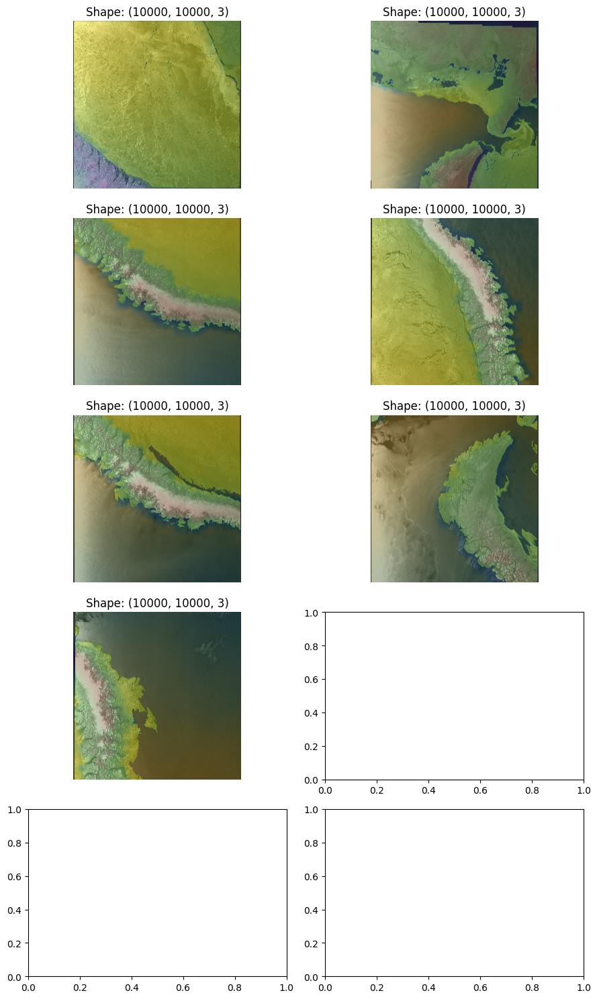

In [13]:
NUM_IMAGES = 10

fig, ax = plt.subplots(nrows = 5, ncols = 2, figsize = (9,15))
ax = ax.flat

for index,row in data.iterrows():
    if index > 9:
        break
    
    
    img = Image.open(row[0]).convert("RGB")
    ax[index].imshow(img)
    
    mk = Image.open(row[1])
    ax[index].imshow(mk, alpha = 0.3)
    
    tp = Image.open(row[2])
    ax[index].imshow(tp, alpha = 0.3)
    
    ax[index].set_title(f'Shape: {np.array(img).shape}')
    ax[index].axis('off')
    
fig.tight_layout()
fig.show()

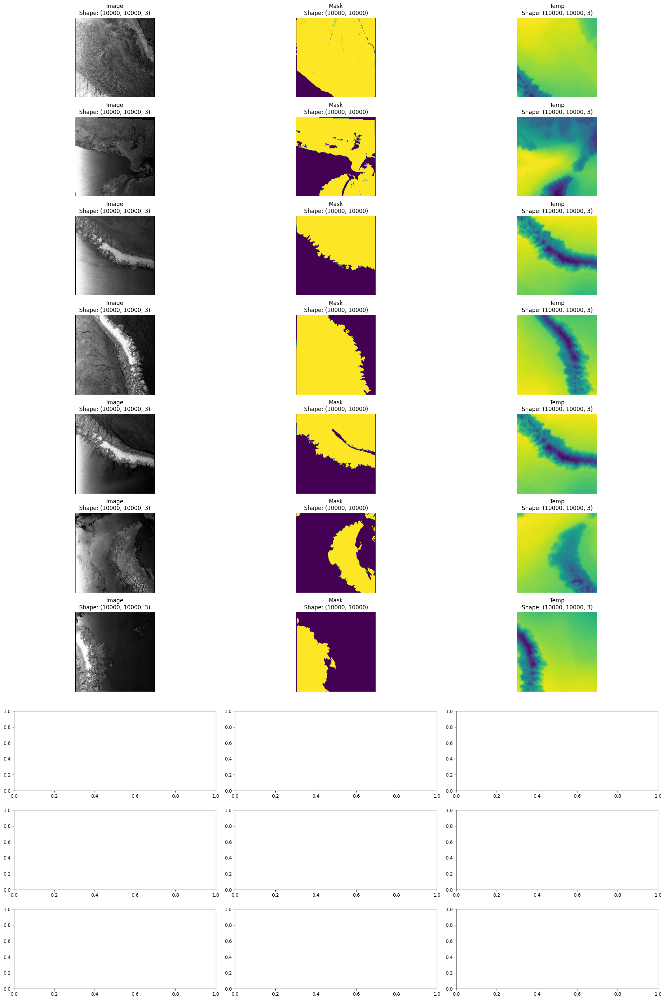

In [14]:
NUM_IMAGES = 10

fig, ax = plt.subplots(nrows = 10, ncols = 3, figsize = (20,30))

for index,row in data.iterrows():
    if index > 9:
        break
    
    img = Image.open(row[0])
    ax[index, 0].imshow(img)
    ax[index, 0].set_title(f'Image\nShape: {np.array(img).shape}')
    ax[index, 0].axis('off')
    
    mk = cv2.imread(str(row[1]), cv2.IMREAD_GRAYSCALE)
    ax[index, 1].imshow(mk)
    ax[index, 1].set_title(f'Mask\nShape: {mk.shape}')
    ax[index, 1].axis('off')
    
    tp = Image.open((row[2]))
    ax[index, 2].imshow(tp)
    ax[index, 2].set_title(f'Temp\nShape: {np.array(img).shape}')
    ax[index, 2].axis('off')
    
fig.tight_layout()
fig.show()

- **training = 70%**
- **validation = 15%**
- **testing = 15%**

In [15]:
SEED = 123

data_train, data_rest = tts(data, 
                        test_size = 0.3, 
                        random_state = SEED)

data_val, data_test = tts(data, 
                      test_size = 0.5, 
                      random_state = SEED)

In [16]:
data_train.shape, data_val.shape, data_test.shape

((375, 4), (268, 4), (269, 4))

In [17]:
data_train

,Image,Mask,Temp,is_mostly_one_color
1054,/kaggle/input/ice020424/metadata/image/1947.png,/kaggle/input/ice020424/metadata/mask/1947.png,/kaggle/input/ice020424/metadata/temp/1947.png,False
2350,/kaggle/input/ice020424/metadata/image/84.png,/kaggle/input/ice020424/metadata/mask/84.png,/kaggle/input/ice020424/metadata/temp/84.png,False
678,/kaggle/input/ice020424/metadata/image/1608.png,/kaggle/input/ice020424/metadata/mask/1608.png,/kaggle/input/ice020424/metadata/temp/1608.png,False
2205,/kaggle/input/ice020424/metadata/image/709.png,/kaggle/input/ice020424/metadata/mask/709.png,/kaggle/input/ice020424/metadata/temp/709.png,False
1813,/kaggle/input/ice020424/metadata/image/356.png,/kaggle/input/ice020424/metadata/mask/356.png,/kaggle/input/ice020424/metadata/temp/356.png,False
...,...,...,...,...
465,/kaggle/input/ice020424/metadata/image/1416.png,/kaggle/input/ice020424/metadata/mask/1416.png,/kaggle/input/ice020424/metadata/temp/1416.png,False
1606,/kaggle/input/ice020424/metadata/image/2443.png,/kaggle/input/ice020424/metadata/mask/2443.png,/kaggle/input/ice020424/metadata/temp/2443.png,False
1747,/kaggle/input/ice020424/metadata/image/297.png,/kaggle/input/ice020424/metadata/mask/297.png,/kaggle/input/ice020424/metadata/temp/297.png,False
1695,/kaggle/input/ice020424/metadata/image/2523.png,/kaggle/input/ice020424/metadata/mask/2523.png,/kaggle/input/ice020424/metadata/temp/2523.png,False


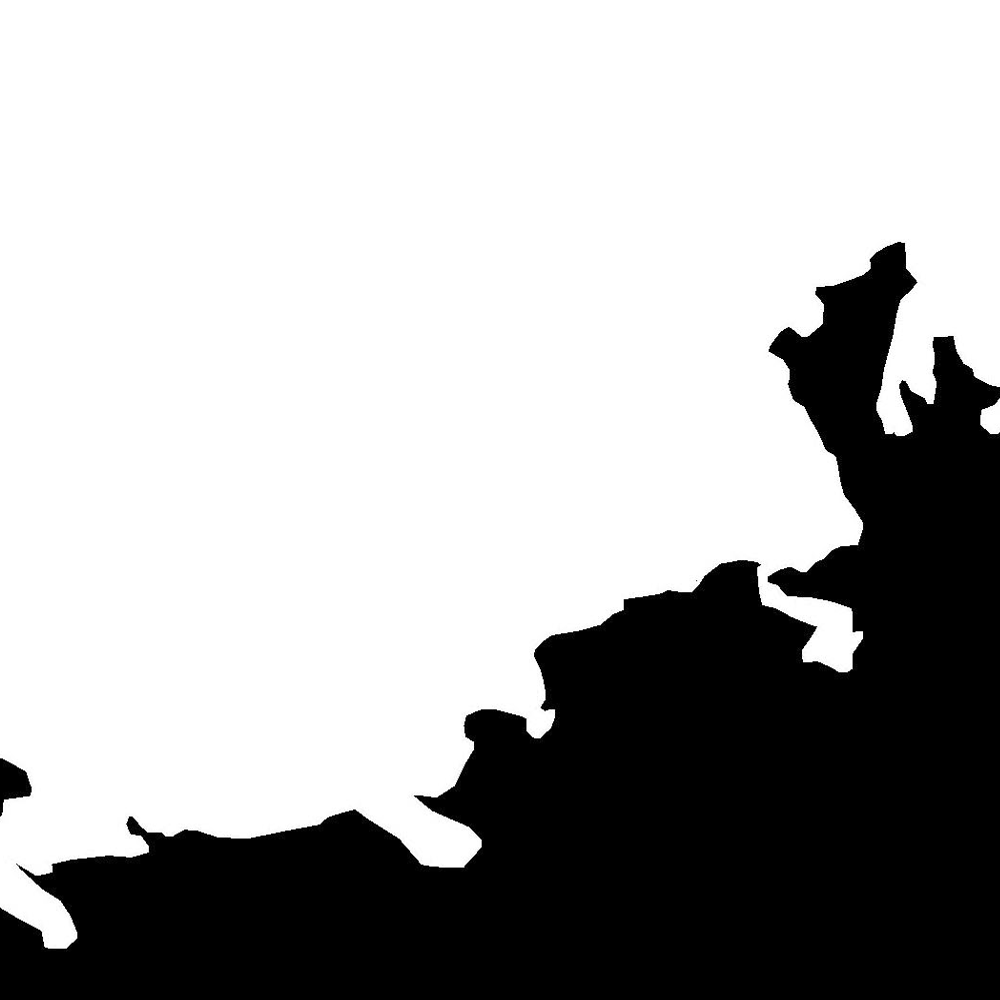

In [18]:
sample = Image.open(data.iloc[0,1])
sample

In [19]:
sample_array = np.array(sample)
sample_array

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

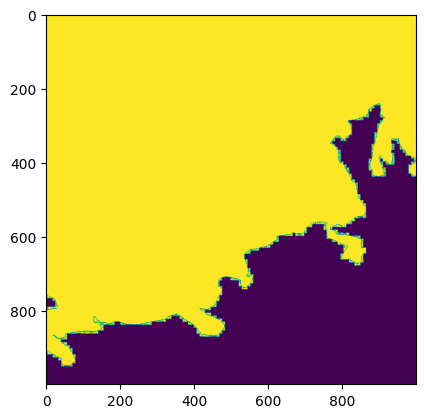

In [20]:
sample_array[sample_array >0] = 1
plt.imshow(sample_array)

In [21]:
def preprocess_mask(mask_path):
    
    mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, dsize = (224, 224))
    mask = np.array(mask).astype(np.float32)
    mask[mask > 0.] = 1.
    
    return mask

- **Dataset**

In [22]:
import torch

class CustomImageMaskDataset(Dataset):
    def __init__(self, data: pd.DataFrame, image_transforms: transforms, mask_transforms: transforms, temp_transforms: transforms):
        self.data = data
        self.image_transforms = image_transforms
        self.mask_transforms = mask_transforms
        self.temp_transforms = temp_transforms
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        image_path = self.data.iloc[idx, 0]
        image = Image.open(image_path).convert("RGB")
        image = self.image_transforms(image)
        
        mask_path = self.data.iloc[idx, 1]
        mask = self.mask_transforms(mask_path)
        mask = np.expand_dims(mask, axis=0)
        
        temp_path = self.data.iloc[idx, 2]
        temp = Image.open(temp_path).convert("RGB")
        temp = self.temp_transforms(temp)
        
        # Преобразование в тензоры
        image_tensor = torch.tensor(image, dtype=torch.float32)
        temp_tensor = torch.tensor(temp, dtype=torch.float32) 
        
        # Конкатенация изображения
        concatenated_data = torch.cat((image_tensor, temp_tensor), dim=0)
        
        return concatenated_data, mask

In [23]:
preprocess_input = get_preprocessing_fn(encoder_name = "resnext50_32x4d", pretrained = "imagenet")
preprocess_input

functools.partial(<function preprocess_input at 0x7da21f68a3b0>, input_space='RGB', input_range=[0, 1], mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

In [24]:
RESIZE = (224, 224)
MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]

image_transforms = transforms.Compose([transforms.Resize(RESIZE), 
                                       transforms.ToTensor(), 
                                       transforms.Normalize(mean = MEAN, 
                                                            std = STD)])

In [25]:
RESIZE = (224, 224)
MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]

temp_transforms = transforms.Compose([transforms.Resize(RESIZE), 
                                       transforms.ToTensor(), 
                                       transforms.Normalize(mean = MEAN, 
                                                            std = STD)])

In [26]:
train_dataset = CustomImageMaskDataset(data_train, image_transforms, preprocess_mask, temp_transforms)

val_dataset = CustomImageMaskDataset(data_val, image_transforms, preprocess_mask, temp_transforms)

In [27]:
# Получить количество элементов в наборе данных
dataset_length = len(train_dataset)

# Посмотреть первый элемент
sample_image, sample_mask = train_dataset[0]

print("Форма изображения:", sample_image.shape)
print("Форма маски:", sample_mask.shape)


Форма изображения: torch.Size([6, 224, 224])
Форма маски: (1, 224, 224)


In [28]:
# Получение первого элемента
first_sample = train_dataset[0]

# Распаковка элементов
image, mask = first_sample

print("Содержимое изображения (первый элемент):", image)
print("Содержимое маски (первый элемент):", mask)

Содержимое изображения (первый элемент): tensor([[[ 1.5125,  1.0844,  0.6563,  ...,  1.5639,  1.4440,  1.4612],
         [ 1.5810,  1.5810,  1.3584,  ...,  1.4612,  1.5639,  1.6324],
         [ 1.1358,  1.1015,  0.7248,  ...,  1.5639,  1.5125,  1.3584],
         ...,
         [-0.5767, -0.5938, -0.8164,  ..., -0.9363, -1.1589, -1.2788],
         [-0.5253, -0.6281, -0.7650,  ..., -1.2274, -1.1247, -0.9705],
         [-0.7137, -0.6794, -0.7479,  ..., -1.2103, -1.1760, -0.9192]],

        [[ 1.6758,  1.2381,  0.8004,  ...,  1.7283,  1.6057,  1.6232],
         [ 1.7458,  1.7458,  1.5182,  ...,  1.6232,  1.7283,  1.7983],
         [ 1.2906,  1.2556,  0.8704,  ...,  1.7283,  1.6758,  1.5182],
         ...,
         [-0.4601, -0.4776, -0.7052,  ..., -0.8277, -1.0553, -1.1779],
         [-0.4076, -0.5126, -0.6527,  ..., -1.1253, -1.0203, -0.8627],
         [-0.6001, -0.5651, -0.6352,  ..., -1.1078, -1.0728, -0.8102]],

        [[ 1.8905,  1.4548,  1.0191,  ...,  1.9428,  1.8208,  1.8383],
    

In [29]:
num_channels = image.shape[0]  # Получение количества каналов
print("Количество каналов в изображении:", num_channels)

Количество каналов в изображении: 6


- **DataLoader's**

In [30]:
BATCH_SIZE = 32
NUM_WORKERS = os.cpu_count()

train_dataloader = DataLoader(dataset = train_dataset, 
                              batch_size = BATCH_SIZE, 
                              shuffle = True, 
                              num_workers = NUM_WORKERS)

val_dataloader = DataLoader(dataset = val_dataset, 
                            batch_size = BATCH_SIZE, 
                            shuffle = True, 
                            num_workers = NUM_WORKERS)

In [31]:
train_dataloader

In [32]:
# Let's visualize a batch.
batch_images, batch_masks = next(iter(train_dataloader))

batch_images.shape, batch_masks.shape

(torch.Size([32, 6, 224, 224]), torch.Size([32, 1, 224, 224]))

# **5. Model**

In [33]:
# GPU
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [34]:
# Define the model to use with the pre-trained weights.
model = UnetPlusPlus(encoder_name = "resnext50_32x4d", 
             encoder_weights = "imagenet", 
             in_channels = 6, 
             classes = 1)

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth
100%|██████████| 95.8M/95.8M [00:00<00:00, 158MB/s] 


In [35]:
# Now Let's visualize the architecture of our model.
summary(model = model, 
        input_size = [8, 6, 224, 224], 
        col_width = 15, 
        col_names = ['input_size', 'output_size', 'num_params', 'trainable'], 
        row_settings = ['var_names'])

Layer (type (var_name))                            Input Shape     Output Shape    Param #         Trainable
UnetPlusPlus (UnetPlusPlus)                        [8, 6, 224, 224] [8, 1, 224, 224] --              True
├─ResNetEncoder (encoder)                          [8, 6, 224, 224] [8, 6, 224, 224] --              True
│    └─Conv2d (conv1)                              [8, 6, 224, 224] [8, 64, 112, 112] 18,816          True
│    └─BatchNorm2d (bn1)                           [8, 64, 112, 112] [8, 64, 112, 112] 128             True
│    └─ReLU (relu)                                 [8, 64, 112, 112] [8, 64, 112, 112] --              --
│    └─MaxPool2d (maxpool)                         [8, 64, 112, 112] [8, 64, 56, 56] --              --
│    └─Sequential (layer1)                         [8, 64, 56, 56] [8, 256, 56, 56] --              True
│    │    └─Bottleneck (0)                         [8, 64, 56, 56] [8, 256, 56, 56] 63,488          True
│    │    └─Bottleneck (1)                  

In [36]:
for param in model.encoder.parameters():
    param.requires_grad = False

In [37]:
# Good, now let's check if the encoder parameters were frozen, for that we have to see that the Trainable column is in False mode.
summary(model = model, 
        input_size = [8, 6, 224, 224], 
        col_width = 15, 
        col_names = ['input_size', 'output_size', 'num_params', 'trainable'], 
        row_settings = ['var_names'])

Layer (type (var_name))                            Input Shape     Output Shape    Param #         Trainable
UnetPlusPlus (UnetPlusPlus)                        [8, 6, 224, 224] [8, 1, 224, 224] --              Partial
├─ResNetEncoder (encoder)                          [8, 6, 224, 224] [8, 6, 224, 224] --              False
│    └─Conv2d (conv1)                              [8, 6, 224, 224] [8, 64, 112, 112] (18,816)        False
│    └─BatchNorm2d (bn1)                           [8, 64, 112, 112] [8, 64, 112, 112] (128)           False
│    └─ReLU (relu)                                 [8, 64, 112, 112] [8, 64, 112, 112] --              --
│    └─MaxPool2d (maxpool)                         [8, 64, 112, 112] [8, 64, 56, 56] --              --
│    └─Sequential (layer1)                         [8, 64, 56, 56] [8, 256, 56, 56] --              False
│    │    └─Bottleneck (0)                         [8, 64, 56, 56] [8, 256, 56, 56] (63,488)        False
│    │    └─Bottleneck (1)          

`loss function` and `optimizer`

In [38]:
loss_fn = smp.losses.SoftBCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr = 0.01, weight_decay = 0.0001)

- **EarlyStopping**
- **train_step**
- **val_step**
- **predictions**
- **loss_and_metric_plot**

In [39]:
class EarlyStopping:
    def __init__(self, patience:int = 5, delta:float = 0.0001, path = "best_model.pth"):
        self.patience = patience
        self.delta = delta
        self.path = path
        self.best_score = None
        self.counter = 0
        self.early_stop = False
        
    def __call__(self, val_loss, model):
        if self.best_score is None:
            self.best_score = val_loss
            self.save_checkpoint(model)
            
        elif val_loss >= self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
                
        else:
            self.best_score = val_loss
            self.save_checkpoint(model)
            self.counter = 0
            
    def save_checkpoint(self, model):
        torch.save(model.state_dict(), self.path)
    

In [40]:
# Define early stopping

early_stopping = EarlyStopping(patience = 10, delta = 0.)

In [41]:
def train_step(model:torch.nn.Module, dataloader:torch.utils.data.DataLoader, 
               loss_fn:torch.nn.Module, optimizer:torch.optim.Optimizer):
    
    model.train()
    
    train_loss = 0.
    train_iou = 0.
    
    for batch, (X,y) in enumerate(dataloader):
        X = X.to(device, dtype = torch.float32)
        y = y.to(device, dtype = torch.float32)
        optimizer.zero_grad()
        logit_mask = model(X)
        loss = loss_fn(logit_mask, y)
        train_loss += loss.item()
        
        loss.backward()
        optimizer.step()
        
        prob_mask = logit_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()
        
        tp,fp,fn,tn = get_stats(output = pred_mask.detach().cpu().long(), 
                                target = y.cpu().long(), 
                                mode = "binary")
        
        train_iou += iou_score(tp, fp, fn, tn, reduction = "micro").numpy()
        
    train_loss = train_loss / len(dataloader)
    train_iou = train_iou / len(dataloader)
    
    return train_loss, train_iou

In [42]:
def val_step(model:torch.nn.Module, 
             dataloader:torch.utils.data.DataLoader, 
             loss_fn:torch.nn.Module):
    
    model.eval()
    
    val_loss = 0.
    val_iou = 0.
    
    with torch.inference_mode():
        for batch,(X,y) in enumerate(dataloader):
            X = X.to(device, dtype = torch.float32)
            y = y.to(device, dtype = torch.float32)
            logit_mask = model(X)
            loss = loss_fn(logit_mask, y)
            val_loss += loss.item()
            
            prob_mask = logit_mask.sigmoid()
            pred_mask = (prob_mask > 0.5).float()
            
            tp, fp, fn, tn = get_stats(output = pred_mask.detach().cpu().long(), 
                                       target = y.cpu().long(), 
                                       mode = "binary")
            
            val_iou += iou_score(tp, fp, fn, tn, reduction = "micro").numpy()
            
    val_loss = val_loss / len(dataloader)
    val_iou = val_iou / len(dataloader)
    
    return val_loss, val_iou
            
    

In [43]:
def train(model:torch.nn.Module, train_dataloader:torch.utils.data.DataLoader, 
          val_dataloader:torch.utils.data.DataLoader, loss_fn:torch.nn.Module, 
          optimizer:torch.optim.Optimizer, early_stopping, epochs:int = 10):
    
    results = {'train_loss':[], 'train_iou':[], 'val_loss':[], 'val_iou':[]}
    
    for epoch in tqdm(range(epochs)):
        train_loss, train_iou = train_step(model = model, 
                                           dataloader = train_dataloader, 
                                           loss_fn = loss_fn, 
                                           optimizer = optimizer)
        
        val_loss, val_iou = val_step(model = model, 
                                     dataloader = val_dataloader, 
                                     loss_fn = loss_fn)
        
        print(f'Epoch: {epoch + 1} | ', 
              f'Train Loss: {train_loss:.4f} | ', 
              f'Train IOU: {train_iou:.4f} | ', 
              f'Val Loss: {val_loss:.4f} | ', 
              f'Val IOU: {val_iou:.4f}')
        
        early_stopping(val_loss, model)
        
        if early_stopping.early_stop == True:
            print("Early Stopping!!!")
            break
            
        results['train_loss'].append(train_loss)
        results['train_iou'].append(train_iou)
        results['val_loss'].append(val_loss)
        results['val_iou'].append(val_iou)
        
    return results

In [44]:
# Training!!!

EPOCHS = 100
torch.cuda.manual_seed(SEED)
torch.manual_seed(SEED)

RESULTS = train(model.to(device), 
                train_dataloader, 
                val_dataloader, 
                loss_fn, 
                optimizer, 
                early_stopping, 
                EPOCHS)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 1 |  Train Loss: 0.5752 |  Train IOU: 0.6014 |  Val Loss: 10.7638 |  Val IOU: 0.5866
Epoch: 2 |  Train Loss: 0.3065 |  Train IOU: 0.8186 |  Val Loss: 0.4401 |  Val IOU: 0.8343
Epoch: 3 |  Train Loss: 0.2195 |  Train IOU: 0.8678 |  Val Loss: 0.2216 |  Val IOU: 0.8914
Epoch: 4 |  Train Loss: 0.2342 |  Train IOU: 0.8563 |  Val Loss: 0.1979 |  Val IOU: 0.8907
Epoch: 5 |  Train Loss: 0.2201 |  Train IOU: 0.8659 |  Val Loss: 0.2016 |  Val IOU: 0.8876
Epoch: 6 |  Train Loss: 0.1867 |  Train IOU: 0.8876 |  Val Loss: 0.3985 |  Val IOU: 0.7254
Epoch: 7 |  Train Loss: 0.2316 |  Train IOU: 0.8631 |  Val Loss: 0.2162 |  Val IOU: 0.8723
Epoch: 8 |  Train Loss: 0.1931 |  Train IOU: 0.8825 |  Val Loss: 0.1992 |  Val IOU: 0.8792
Epoch: 9 |  Train Loss: 0.2111 |  Train IOU: 0.8687 |  Val Loss: 0.1433 |  Val IOU: 0.9218
Epoch: 10 |  Train Loss: 0.1764 |  Train IOU: 0.8969 |  Val Loss: 0.1564 |  Val IOU: 0.9104
Epoch: 11 |  Train Loss: 0.1499 |  Train IOU: 0.9076 |  Val Loss: 0.1668 |  Val IOU: 0.9

In [44]:
def loss_and_metric_plot(results:dict):
    plt.style.use("ggplot")
    
    training_loss = results['train_loss']
    training_metric = results['train_iou']
    valid_loss = results['val_loss']
    valid_metric = results['val_iou']
    
    fig,ax = plt.subplots(nrows = 1, ncols = 2, figsize = (9,4))
    ax = ax.flat
    
    ax[0].plot(training_loss, color = "red", label = 'Train')
    ax[0].plot(valid_loss, color = "blue", label = 'Valid')
    ax[0].set_ylabel("Loss", fontsize = 8, fontweight = "bold", color = "black")
    ax[0].set_xlabel("Epoch", fontsize = 8, fontweight = "bold", color = "black")
    ax[0].set_title("DiceLoss", fontsize = 11, fontweight = "bold", color = "black")
    
    ax[1].plot(training_metric, color = "red", label = 'Train')
    ax[1].plot(valid_metric, color = "blue", label = 'Valid')
    ax[1].set_ylabel("Score", fontsize = 8, fontweight = "bold", color = "black")
    ax[1].set_xlabel("Epoch", fontsize = 8, fontweight = "bold", color = "black")
    ax[1].set_title("IOU", fontsize = 11, fontweight = "bold", color = "black")
    
    ax[0].legend()
    ax[1].legend()
    fig.tight_layout()
    fig.show()

In [ ]:
loss_and_metric_plot(RESULTS)

In [82]:
def predictions(test_dataloader:torch.utils.data.DataLoader):
    
    loaded_model = UnetPlusPlus(encoder_name = "resnext50_32x4d", 
             encoder_weights = "imagenet", 
             in_channels = 6, 
             classes = 1)

    checkpoint = torch.load("/kaggle/working/best_model.pth")

    loaded_model.load_state_dict(checkpoint)

    loaded_model.to(device)

    loaded_model.eval()

    pred_mask_test = []

    with torch.inference_mode():
        for X,_ in tqdm(test_dataloader):
            X = X.to(device, dtype = torch.float)
            logit_mask = loaded_model(X)
            prob_mask = logit_mask.sigmoid()
            pred_mask = (prob_mask > 0.5).float()
            pred_mask_test.append(pred_mask.detach().cpu())

    pred_mask_test = torch.cat(pred_mask_test)

    return pred_mask_test

- **Predictions**

In [1]:
test_dataset = CustomImageMaskDataset(data_test, 
                                      image_transforms,
                                      preprocess_mask,
                                      temp_transforms )

test_dataloader = DataLoader(dataset = test_dataset, 
                             batch_size = BATCH_SIZE, 
                             shuffle = False, 
                             num_workers = NUM_WORKERS)

NameError: name 'CustomImageMaskDataset' is not defined

In [85]:
pred_mask_test = predictions(test_dataloader)

  0%|          | 0/9 [00:00<?, ?it/s]

RuntimeError: Given groups=1, weight of size [64, 6, 7, 7], expected input[32, 3, 224, 224] to have 6 channels, but got 3 channels instead

In [56]:
# We are going to create our tensors so we can plot later.
IMAGE_TEST = []
MASK_TEST = []

for img,mask in test_dataloader:
  IMAGE_TEST.append(img)
  MASK_TEST.append(mask)

IMAGES_TEST = torch.cat(IMAGE_TEST)

MASKS_TEST = torch.cat(MASK_TEST)

# **6. Metric**

- **IOU**

In [57]:
TP, FP, FN, TN = get_stats(pred_mask_test.long(), 
                           (MASKS_TEST>0.5).float().long(), 
                           mode = "binary")

In [58]:
iou_test = iou_score(TP, FP, FN, TN, reduction = "micro")
print(f'IOU Test = {iou_test:.4f}')

IOU Test = 0.9421


# **7. Display of test images and masks**

In [70]:
# We convert the mean and std to a tensor.
MEAN_TENSOR = torch.tensor(MEAN)
STD_TENSOR = torch.tensor(STD)

In [71]:
# We convert the mean and std to a tensor to multiply it with the tensor that contains the images.
IMAGES_TEST[:, :3, :, :] = IMAGES_TEST[:, :3, :, :] * STD_TENSOR.view(1, 3, 1, 1) + MEAN_TENSOR.view(1, 3, 1, 1)
IMAGES_TEST.shape

torch.Size([269, 6, 224, 224])

In [69]:
#размер IMAGES_TEST
print(IMAGES_TEST.shape)

# размеры MEAN_TENSOR и STD_TENSOR
print(MEAN_TENSOR.shape)  # Должно быть [3]
print(STD_TENSOR.shape)   # Должно быть [3]


torch.Size([269, 6, 224, 224])
torch.Size([3, 1, 1])
torch.Size([3, 1, 1])


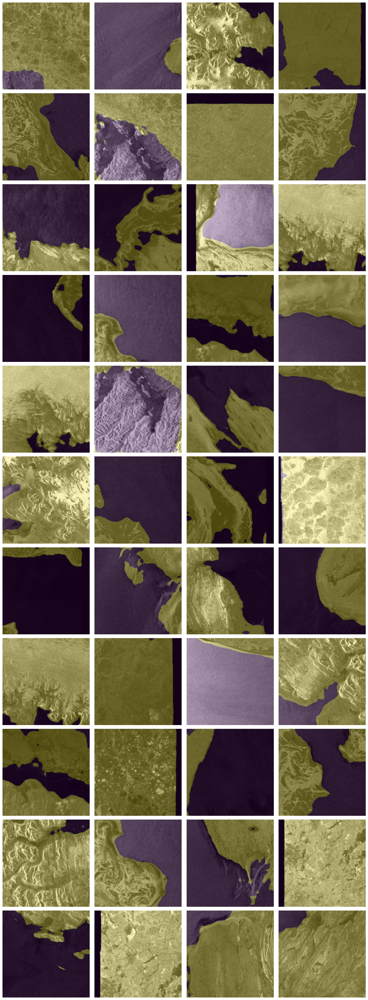

In [94]:
# We visualize each image and the mask prediction.
fig, ax = plt.subplots(nrows = 11, ncols = 4, figsize = (15, 40))
ax = ax.flat

for i,(img, mask_pred) in enumerate(zip(IMAGES_TEST, pred_mask_test)):
    if i>43:
        break
    ax[i].imshow(img.permute(1, 2, 0).numpy()[:, :, :3]) #Тут берем первые 3 канала
    ax[i].imshow(mask_pred.squeeze().numpy(), alpha=0.3)
    ax[i].axis('off')
    
fig.tight_layout()
fig.show()

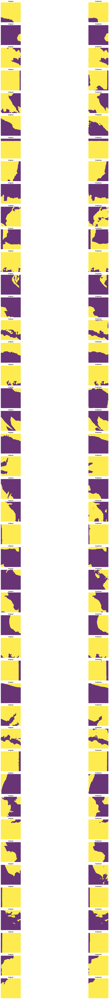

In [95]:
# We visualize each prediction and its respective original mask.
fig, ax = plt.subplots(nrows = 44, ncols = 2, figsize = (30, 120))

for i,(j,k) in enumerate(zip(MASKS_TEST, pred_mask_test)):
    
    if i>43:
        break
        
    ax[i,0].imshow(j.squeeze().numpy(), alpha = 0.8)
    ax[i,0].set_title("Original", fontsize = 10, fontweight = "bold")
    ax[i,0].axis('off')
    
    ax[i,1].imshow(k.squeeze().numpy(), alpha = 0.8)
    ax[i,1].set_title("Predicted", fontsize = 10, fontweight = "bold")
    ax[i,1].axis('off')
  

fig.tight_layout()
fig.show()